### Warmup tree species classification

This notebook contains a template for classification of two tree species from the PureForest dataset.

Before you start: if you're using colab it might be useful to select gpu as hardware accelerator now.

Runtime -> change runtime type -> e.g. T4 GPU

In [ ]:
!pip install pytorch-lightning # not available by default via colab
!pip install kornia # also not installed by default

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.4/899.4 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.6 MB/s eta 0:00:00


In [ ]:
from huggingface_hub import hf_hub_download
import zipfile
from PIL import Image
import numpy as np
from pathlib import Path
import pandas as pd
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torchvision.models as models
from torchmetrics import Accuracy
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import Callback
from random import randint
import matplotlib.pyplot as plt
import kornia.augmentation as kaug
from kornia import image_to_tensor
from random import random, randint, choice

### Download files


In [ ]:
species_folders = {
    "Castanea_sativa": "data/imagery-Castanea_sativa.zip",
    "Pinus_nigra": "data/imagery-Pinus_nigra.zip"
}

main_subfolders = {
    "aerial_imagery": "imagery/",
    "lidar": "lidar/"
}

# Create a dedicated folder for the PureForest dataset to keep each tree species
# organized, avoiding multiple directories in the main content folder.
dataset_folder = Path.cwd() / "PureForest_dataset"
dataset_folder.mkdir(exist_ok=True)

for filename in species_folders:
    print(f"\nProcessing {species_folders[filename]}...")

    # Download file
    file_path = hf_hub_download(
        repo_id="IGNF/PureForest",
        filename=species_folders[filename],
        repo_type="dataset"
    )

    extract_dir = dataset_folder / filename
    extract_dir.mkdir(exist_ok=True)

    try:
        with zipfile.ZipFile(file_path, "r") as zip_ref:
            # Get list of all files in zip
            image_file_list = zip_ref.namelist()

            # Extract all files, modifying their paths
            for image_file in image_file_list:
                # Extract file with modified path
                source = zip_ref.read(image_file)

                # I assumed we are using aeirla imagery data. However, if needed,
                # a simple function can be written that chooses either aerial or
                # LiDAR data
                target_path = extract_dir / Path(image_file).relative_to(main_subfolders["aerial_imagery"])

                # Create directories if they don't exist
                target_path.parent.mkdir(parents=True, exist_ok=True)

                with open(target_path, "wb") as f:
                    f.write(source)

            print(f"Successfully extracted to {extract_dir}")

            extracted_files = Path(extract_dir).iterdir()
            print("Extracted files:")
            for extracted_file in list(extracted_files)[:5]:
                print(f"- {extracted_file.stem}")
            if len(list(extracted_files)) > 5:
                print(f"... and {len(extracted_files) - 5} more files")

    except zipfile.BadZipFile:
        print(f"Error: {filename} is not a valid zip file")


Processing data/imagery-Castanea_sativa.zip...


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


imagery-Castanea_sativa.zip:   0%|          | 0.00/700M [00:00<?, ?B/s]

Successfully extracted to /content/PureForest_dataset/Castanea_sativa
Extracted files:
- test
- val
- train

Processing data/imagery-Pinus_nigra.zip...


imagery-Pinus_nigra.zip:   0%|          | 0.00/599M [00:00<?, ?B/s]

Successfully extracted to /content/PureForest_dataset/Pinus_nigra
Extracted files:
- test
- val
- train


### Load data set


In [ ]:
def load_dataset(main_dir: dict, splits=["train", "test", "val"]):
    dataset = {split: {"labels": [], "paths": []} for split in splits} # PLEASE KEEP "paths" KEY!!!!!
    base_dirs = list(main_dir.glob("*"))

    # Create label mapping
    label_map = {base_dir.stem: idx for idx, base_dir in enumerate(base_dirs)}

    print("Label mapping:", label_map)

    # Load images and create labels
    for base_dir in base_dirs:
        label = label_map[base_dir.stem]

        for split in splits:
            split_dir = main_dir / base_dir / split
            #split_dir = base_dir
            if not split_dir.exists():
                print(f"Warning: {split_dir} does not exist")
                continue

            # Get all TIFF files in the directory
            tiff_files = list(split_dir.glob("*.tiff")) + list(
                split_dir.glob("*.tif")
            )

            print(f"Loading {len(tiff_files)} images from {split_dir}")

            for tiff_path in tiff_files:
                dataset[split]["labels"].append(label)
                dataset[split]["paths"].append(tiff_path)

    # Convert lists to numpy arrays
    for split in splits:
        dataset[split]["labels"] = np.array(dataset[split]["labels"])

    return dataset, label_map


# Use the function
dataset, label_map = load_dataset(dataset_folder)

# Print dataset information
for split in dataset.keys():
    if len(dataset[split]["paths"]) > 0:
        print(f"\n{split} set:")
        print(f"Number of images: {len(dataset[split]['paths'])}")
        print(f"Labels shape: {dataset[split]['labels'].shape}")
        print(f"Unique labels: {np.unique(dataset[split]['labels'])}")
        unique_labels, label_counts = np.unique(
            dataset[split]["labels"], return_counts=True
        )
        print(f"Class distribution: {dict(zip(unique_labels, label_counts))}")

Label mapping: {'Pinus_nigra': 0, 'Castanea_sativa': 1}
Loading 2532 images from /content/PureForest_dataset/Pinus_nigra/train
Loading 640 images from /content/PureForest_dataset/Pinus_nigra/test
Loading 26 images from /content/PureForest_dataset/Pinus_nigra/val
Loading 3337 images from /content/PureForest_dataset/Castanea_sativa/train
Loading 200 images from /content/PureForest_dataset/Castanea_sativa/test
Loading 147 images from /content/PureForest_dataset/Castanea_sativa/val

train set:
Number of images: 5869
Labels shape: (5869,)
Unique labels: [0 1]
Class distribution: {0: 2532, 1: 3337}

test set:
Number of images: 840
Labels shape: (840,)
Unique labels: [0 1]
Class distribution: {0: 640, 1: 200}

val set:
Number of images: 173
Labels shape: (173,)
Unique labels: [0 1]
Class distribution: {0: 26, 1: 147}


### Show a few samples

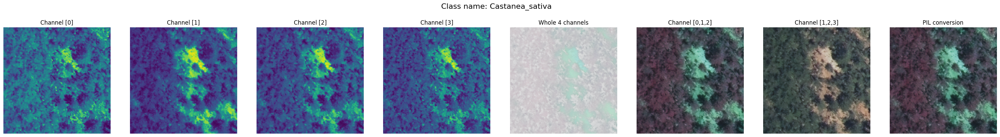

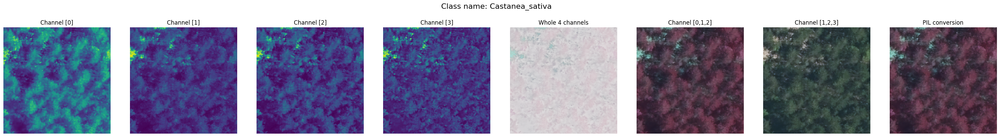

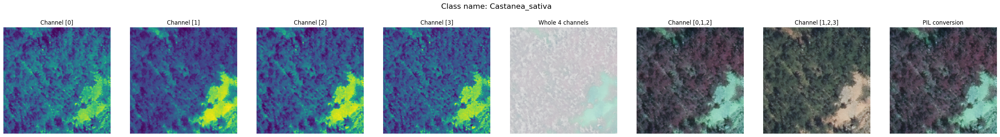

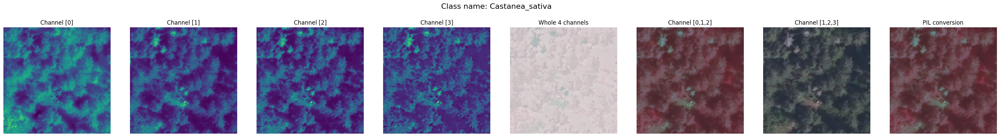

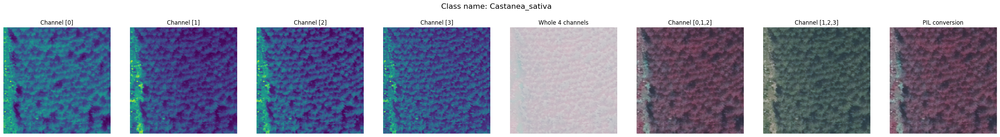

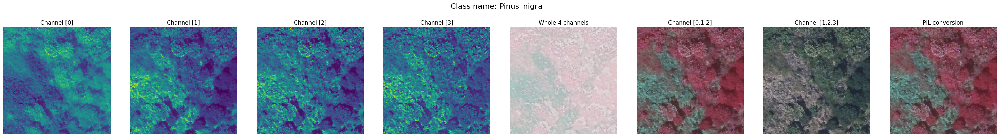

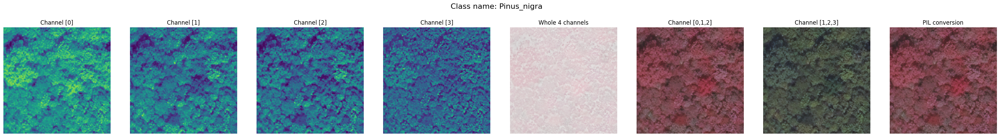

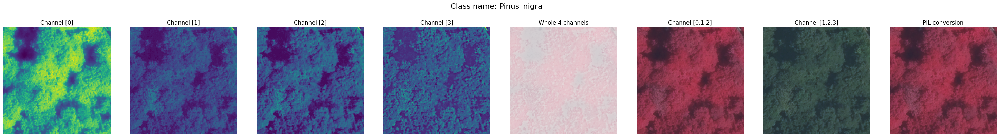

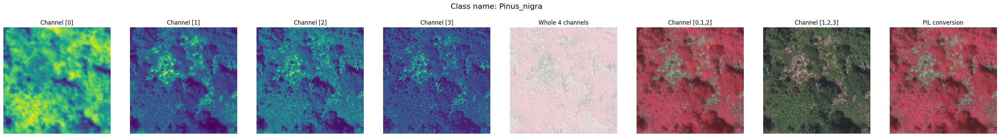

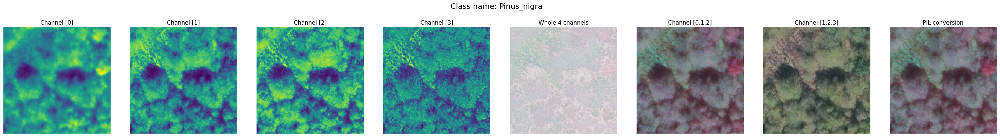

In [ ]:
import matplotlib.pyplot as plt
from random import randint
from PIL import Image

n_of_images = 5 # How many samples You want do display


titles = [f'Channel [{i}]' for i in range(4)]; titles.extend(['Whole 4 channels', 'Channel [0,1,2]', 'Channel [1,2,3]', 'PIL conversion'])
channels = [[0], [1], [2], [3], [0,1,2,3], [0,1,2], [1,2,3], None]

unique_classes = np.unique(dataset['train']['labels'])
class_names = list(species_folders.keys())


for label in unique_labels:

  alredy_displayed = [] # This object will contains alredy picked samples' indices
  indices = np.where(dataset['train']['labels'] == label)[0]

  for _ in range(n_of_images):

    fig, axs = plt.subplots(1,8, figsize=(30, 20))

    # To avoid displaying repetitive images
    unique = False
    while not unique:
      idx = choice(indices) # picking random sample
      unique = True if idx not in alredy_displayed else False

    alredy_displayed.append(idx)

    # Reading samples
    img_path = dataset["train"]["paths"][idx]
    img = np.array(Image.open(img_path))
    label = class_names[dataset["train"]["labels"][idx]]

    fig.suptitle(f'Class name: {label}', fontsize=16, y=0.61)
    fig.tight_layout()

    for i, ax in enumerate(axs):

      ax.imshow(img[...,channels[i]] if channels[i] else Image.fromarray(img).convert('RGB'))
      ax.set_title(titles[i])
      ax.axis('off')

    plt.show()
    plt.close()

### Balance classes

In [ ]:
def clip_balanced_dataset(dataset):
    clipped_dataset = {}
    for split in dataset.keys():
        if len(dataset[split]["paths"]) == 0:
            continue

        # Identify minimum class count for this split
        unique_labels, label_counts = np.unique(
            dataset[split]["labels"], return_counts=True
        )
        min_class_count = min(label_counts)

        # Prepare clipped data
        labels_clipped = []
        paths_clipped = []

        for label in unique_labels:
            # Find indices of images with the current label
            indices = np.where(dataset[split]["labels"] == label)[0]

            # Randomly select min_class_count indices from these
            selected_indices = np.random.choice(indices, min_class_count, replace=False)

            # Append selected samples to clipped data lists
            labels_clipped.extend(dataset[split]["labels"][selected_indices])
            paths_clipped.extend([dataset[split]["paths"][i] for i in selected_indices])

        # Convert to numpy arrays
        clipped_dataset[split] = {
            "labels": np.array(labels_clipped),
            "paths": paths_clipped,
        }

    return clipped_dataset


clipped_dataset = clip_balanced_dataset(dataset)

# Print dataset information
for split in clipped_dataset.keys():
    if len(clipped_dataset[split]["paths"]) > 0:
        print(f"\n{split} set:")
        print(f"Labels shape: {clipped_dataset[split]['labels'].shape}")
        print(f"Unique labels: {np.unique(clipped_dataset[split]['labels'])}")
        unique_labels, label_counts = np.unique(
            clipped_dataset[split]["labels"], return_counts=True
        )
        print(f"Class distribution: {dict(zip(unique_labels, label_counts))}")


train set:
Labels shape: (5064,)
Unique labels: [0 1]
Class distribution: {0: 2532, 1: 2532}

test set:
Labels shape: (400,)
Unique labels: [0 1]
Class distribution: {0: 200, 1: 200}

val set:
Labels shape: (52,)
Unique labels: [0 1]
Class distribution: {0: 26, 1: 26}


4 channels in each picture seem intriguing to me. Let's check what they are:

In [ ]:
def inspect_first_images(main_dir: Path):
    base_dirs = list(main_dir.glob("*"))

    for base_dir in base_dirs:
        train_dir = Path(base_dir) / "train"
        if not train_dir.exists():
            print(f"Warning: {train_dir} does not exist")

        # Get first TIFF file
        tiff_image_path = next(train_dir.iterdir())

        if tiff_image_path:
            print(f"\nInspecting first image from {base_dir.stem}:")
            print(f"Path: {tiff_image_path}")

            with Image.open(tiff_image_path) as img:
                print(f"Mode: {img.mode}")
                print(f"Bands: {img.getbands()}")

                img_array = np.array(img)
                print(f"Array shape: {img_array.shape}")
                print("Channel ranges:")
                for i in range(img_array.shape[-1]):
                    print(
                        f"Channel {i}: min={img_array[...,i].min()}, max={img_array[...,i].max()}"
                    )



inspect_first_images(dataset_folder)


Inspecting first image from Pinus_nigra:
Path: /content/PureForest_dataset/Pinus_nigra/train/TRAIN-Pinus_nigra-C7-100_5_49.tiff
Mode: RGBA
Bands: ('R', 'G', 'B', 'A')
Array shape: (250, 250, 4)
Channel ranges:
Channel 0: min=34, max=195
Channel 1: min=25, max=228
Channel 2: min=37, max=221
Channel 3: min=34, max=212

Inspecting first image from Castanea_sativa:
Path: /content/PureForest_dataset/Castanea_sativa/train/TRAIN-Castanea_sativa-C3-67_4_142.tiff
Mode: RGBA
Bands: ('R', 'G', 'B', 'A')
Array shape: (250, 250, 4)
Channel ranges:
Channel 0: min=29, max=209
Channel 1: min=36, max=173
Channel 2: min=54, max=175
Channel 3: min=52, max=177


### Data Augmentation

In [ ]:
class Preprocess(nn.Module):
    """Module to perform pre-process using Kornia on torch tensors."""

    @torch.no_grad()  # disable gradients for efficiency
    def forward(self, x):
        x_tmp = np.array(x)
        x_out = image_to_tensor(x_tmp, keepdim=True)
        return x_out.float() / 255.0


class Transforms(nn.Module):
  def __init__(self, prob:float=0.5, test:bool=False):
    """
    Class handles transformation of immages:
    Params:
      prob (floating) - propability of applying transformation
      test (boolean) - specify if the current transformation works on train or test set
    """
    super().__init__()
    self.prob = prob
    self.test = test


    self.train_transforms = [
      kaug.RandomHorizontalFlip(p=1.0),
      kaug.RandomVerticalFlip(p=1.0),
      kaug.RandomRotation(degrees=30, p=1.0),
      #kaug.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0), # This tranformation is making some issues while images are not in RGB or grayscale
      kaug.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10, p=1.0),
      kaug.RandomPerspective(distortion_scale=0.2, p=1.0),
      kaug.RandomGaussianNoise(mean=0.0, std=0.1, p=1.0),
    ]

    self.resize = kaug.Resize(size=(224, 224))

  @torch.no_grad()
  def forward(self, x):

    if self.test or random() < self.prob:
      result = self.resize(x)
      return result.squeeze()

    else:
      transform = choice(self.train_transforms) # In paper method applies only one transformation at once, might change in the future
      result = transform(self.resize(x))
      return result.squeeze()

Now we know that 4 channels correspond to RGBA values. "A" stands for alpha and is probably redundant for us.

In [ ]:
class ForestDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        # Define a default transform if none is provided
        # TODO: Use transforms suitable for the model
        self.transform = transform or transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]
                ),  # Adjust as needed for RGB channels
            ]
        )

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # TODO: Load an image from path here
        image_path = self.image_paths[idx]
        label = self.labels[idx]

        with Image.open(image_path) as img:
            # Convert to numpy array
            image = np.array(img)

        # Convert numpy array to a PIL Image if needed
        if isinstance(image, np.ndarray):
            image = Image.fromarray(image)

        # Convert image to RGB if it has an alpha channel
        if image.mode == "RGBA":
            image = image.convert("RGB")

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        return image, label


class ForestDataModule(pl.LightningDataModule):
    def __init__(self, train_data, val_data, test_data, batch_size=32):
        super().__init__()
        self.train_data = train_data
        self.val_data = val_data
        self.test_data = test_data
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset = ForestDataset(
            image_paths=self.train_data["paths"], labels=self.train_data["labels"], transform=Preprocess() # TRANSFORMS APPLIED!!!!
        )
        self.val_dataset = ForestDataset(
            image_paths=self.val_data["paths"], labels=self.val_data["labels"], transform=Preprocess() # !!!!!!!!!
        )
        self.test_dataset = ForestDataset(
            image_paths=self.test_data["paths"], labels=self.test_data["labels"], transform=Preprocess() # !!!!!!!!!
        )

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size)

In [ ]:
class ResNetClassifier(pl.LightningModule):
    def __init__(self, num_classes=2, learning_rate=1e-3, transform=Transforms()):
        super(ResNetClassifier, self).__init__()
        self.save_hyperparameters()

        # Load data augmentation
        self.transform = transform

        # Load a pre-trained ResNet18 and modify the final layer
        self.model = models.resnet18(pretrained=True)

        # Freeze pre-trained layers
        for param in self.model.parameters():
            param.requires_grad = False

        in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features, num_classes)

        # Define a loss function and metric
        self.criterion = nn.CrossEntropyLoss()
        if num_classes == 2:
            self.accuracy = Accuracy(task="binary")
        else:
            self.accuracy = Accuracy(task="multiclass", num_classes=num_classes)

    def forward(self, x):
        return self.model(x)

    def on_after_batch_transfer(self, batch, dataloader_idx):
        x, y = batch
        self.transform.test = not self.trainer.training
        x = self.transform(x)
        return x, y

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        # Calculate and log accuracy
        predicted_classes = torch.argmax(outputs, dim=1)
        acc = self.accuracy(predicted_classes, labels)
        self.log("train_loss", loss, on_epoch=True, prog_bar=True)
        self.log("train_acc", acc, prog_bar=True)
        current_lr = self.trainer.optimizers[0].param_groups[0]['lr']
        self.log('learning_rate', current_lr, prog_bar=True) # log learning rate for testing purposes
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        predicted_classes = torch.argmax(outputs, dim=1)
        acc = self.accuracy(predicted_classes, labels)
        self.log("val_loss", loss)
        self.log("val_acc", acc, prog_bar=True)

        return loss

    def test_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        predicted_classes = torch.argmax(outputs, dim=1)
        acc = self.accuracy(predicted_classes, labels)
        self.log("test_loss", loss, on_epoch=True, prog_bar=True)
        self.log("test_acc", acc, prog_bar=True)

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.model.fc.parameters(), lr=self.hparams.learning_rate)

        # Decay LR by a factor of 0.1 every 1 epoch
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.1) # TODO: tune parameters

        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler
            }
        }

Before you start training, make sure that you have access to GPU:

In [ ]:
print(torch.cuda.is_available())

True


In [ ]:
data_module = ForestDataModule(
    dataset["train"], dataset["val"], dataset["test"], batch_size=32
)

num_classes = 2  # Update as needed
model = ResNetClassifier(num_classes=num_classes)


class PrintMetricsCallback(Callback):
    def __init__(self):
        self.train_metrics = {"loss": [], "acc": []}
        self.val_metrics = {"loss": [], "acc": []}

    def on_train_epoch_end(self, trainer, pl_module):
        train_loss = trainer.callback_metrics['train_loss'].item()
        train_acc = trainer.callback_metrics['train_acc'].item()
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")

        self.train_metrics['loss'].append(train_loss)
        self.train_metrics['acc'].append(train_acc)

    def on_validation_epoch_end(self, trainer, pl_module):
        val_loss = trainer.callback_metrics['val_loss'].item()
        val_acc = trainer.callback_metrics['val_acc'].item()
        print(f"Epoch: {trainer.current_epoch}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}", end=' || ')

        self.val_metrics['loss'].append(val_loss)
        self.val_metrics['acc'].append(val_acc)

print_metrics_callback = PrintMetricsCallback()

# Add the callback to your Trainer
trainer = Trainer(
    max_epochs=10, devices=1, accelerator="gpu", callbacks=[print_metrics_callback], num_sanity_val_steps=0
)

trainer.fit(model, data_module)
trainer.test(model, datamodule=data_module)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/parsing.py:208: Attribute 'transform' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['transform'])`.
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoin

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:368: You have overridden `on_after_batch_transfer` in `LightningModule` but have passed in a `LightningDataModule`. It will use the implementation from `LightningModule` instance.


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 0, Val Loss: 0.2179, Val Acc: 0.9017 || Train Loss: 0.2577, Train Acc: 0.8462


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 1, Val Loss: 0.2132, Val Acc: 0.9249 || Train Loss: 0.1204, Train Acc: 0.9231


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 2, Val Loss: 0.2599, Val Acc: 0.8960 || Train Loss: 0.1044, Train Acc: 0.6923


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 3, Val Loss: 0.2204, Val Acc: 0.9075 || Train Loss: 0.0857, Train Acc: 0.7692


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 4, Val Loss: 0.2705, Val Acc: 0.8960 || Train Loss: 0.0804, Train Acc: 1.0000


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 5, Val Loss: 0.2029, Val Acc: 0.9191 || Train Loss: 0.0901, Train Acc: 1.0000


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 6, Val Loss: 0.2114, Val Acc: 0.9249 || Train Loss: 0.0784, Train Acc: 0.9231


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 7, Val Loss: 0.1989, Val Acc: 0.9364 || Train Loss: 0.0784, Train Acc: 1.0000


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 8, Val Loss: 0.2525, Val Acc: 0.9017 || Train Loss: 0.0834, Train Acc: 0.7692


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch: 9, Val Loss: 0.2139, Val Acc: 0.9191 || Train Loss: 0.0802, Train Acc: 1.0000


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.851190447807312     │
│         test_loss         │    0.3343389630317688     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.3343389630317688, 'test_acc': 0.851190447807312}]

In [ ]:
train_metrics = print_metrics_callback.train_metrics
val_metrics = print_metrics_callback.val_metrics

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics(train_metrics, val_metrics):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_metrics["loss"], label="Train Loss")
    plt.plot(val_metrics["loss"], label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Loss")

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(train_metrics["acc"], label="Train Accuracy")
    plt.plot(val_metrics["acc"], label="Val Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Accuracy")

    plt.tight_layout()
    plt.show()

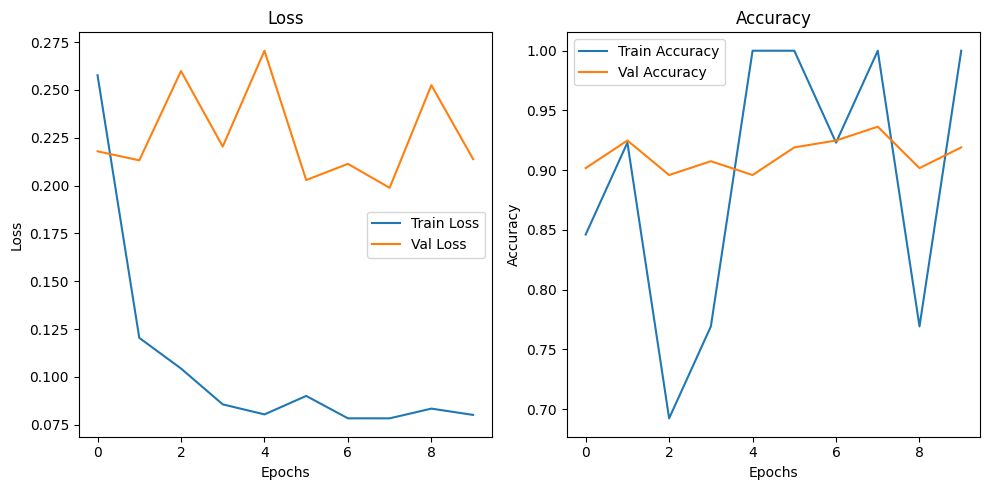

In [ ]:
plot_metrics(train_metrics, val_metrics)